---

### Project description:

You've been offered an internship in the analytical department at Yandex.Afisha. Your first task is to help optimize marketing expenses.

### Step 1. Download the data and prepare it for analysis

In [1]:
!pip install plotly==4.13.0
import pandas as pd
visits = pd.read_csv('/datasets/visits_log_us.csv', parse_dates=['Start Ts', 'End Ts'])
visits.columns = visits.columns.str.replace(' ', '_').str.lower()
visits['device'] = visits['device'].astype('category')
print(visits.head())
print(visits.tail())
print(visits.info())
print(visits.describe())
dup = visits.duplicated().sum()
print(dup) # there is no duplicates

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 13.1 MB 2.0 MB/s eta 0:00:01
    device              end_ts  source_id            start_ts  \
0    touch 2017-12-20 17:38:00          4 2017-12-20 17:20:00   
1  desktop 2018-02-19 17:21:00          2 2018-02-19 16:53:00   
2    touch 2017-07-01 01:54:00          5 2017-07-01 01:54:00   
3  desktop 2018-05-20 11:23:00          9 2018-05-20 10:59:00   
4  desktop 2017-12-27 14:06:00          3 2017-12-27 14:06:00   

                    uid  
0  16879256277535980062  
1    104060357244891740  
2   7459035603376831527  
3  16174680259334210214  
4   9969694820036681168  
         device              end_ts  source_id            start_ts  \
359395  desktop 2017-07-29 19:07:19          2 2017-07-29 19:07:00   
359396    touch 2018-01-25 17:38:19          1 2018-01-25 17:38:00   
359397  desktop 2018-03-03 10:12:19          4 2018-03-03 10:12:00   
359398  desktop 2017-11-02

In [2]:
### Reviewer's code
display(visits.head())
display(visits.tail())
display(visits.info())
display(visits.describe())

,device,end_ts,source_id,start_ts,uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


,device,end_ts,source_id,start_ts,uid
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485
359399,touch,2017-09-10 13:13:19,2,2017-09-10 13:13:00,18396128934054549559


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
device       359400 non-null category
end_ts       359400 non-null datetime64[ns]
source_id    359400 non-null int64
start_ts     359400 non-null datetime64[ns]
uid          359400 non-null uint64
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB


None

,source_id,uid
count,359400.000000,3.594000e+05
mean,3.750515,9.202557e+18
std,1.917116,5.298433e+18
min,1.000000,1.186350e+13
25%,3.000000,4.613407e+18
50%,4.000000,9.227413e+18
75%,5.000000,1.372824e+19
max,10.000000,1.844668e+19


In [3]:
orders = pd.read_csv('/datasets/orders_log_us.csv', parse_dates=['Buy Ts'])
orders.columns = orders.columns.str.replace(' ', '_').str.lower()
print(orders.head())
print(orders.tail())
print(orders.info())
print(orders.describe())
dup = orders.duplicated().sum()
print(dup) # there is no duplicates

               buy_ts  revenue                   uid
0 2017-06-01 00:10:00    17.00  10329302124590727494
1 2017-06-01 00:25:00     0.55  11627257723692907447
2 2017-06-01 00:27:00     0.37  17903680561304213844
3 2017-06-01 00:29:00     0.55  16109239769442553005
4 2017-06-01 07:58:00     0.37  14200605875248379450
                   buy_ts  revenue                   uid
50410 2018-05-31 23:50:00     4.64  12296626599487328624
50411 2018-05-31 23:50:00     5.80  11369640365507475976
50412 2018-05-31 23:54:00     0.30   1786462140797698849
50413 2018-05-31 23:56:00     3.67   3993697860786194247
50414 2018-06-01 00:02:00     3.42     83872787173869366
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
buy_ts     50415 non-null datetime64[ns]
revenue    50415 non-null float64
uid        50415 non-null uint64
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB
None
            revenue           uid
count  50415.00

In [4]:
costs = pd.read_csv('/datasets/costs_us.csv', parse_dates=['dt'])
print(costs.head())
print(costs.tail())
print(costs.info())
print(costs.describe())
dup = costs.duplicated().sum()
print(dup) # there is no duplicates

   source_id         dt  costs
0          1 2017-06-01  75.20
1          1 2017-06-02  62.25
2          1 2017-06-03  36.53
3          1 2017-06-04  55.00
4          1 2017-06-05  57.08
      source_id         dt  costs
2537         10 2018-05-27   9.92
2538         10 2018-05-28  21.26
2539         10 2018-05-29  11.32
2540         10 2018-05-30  33.15
2541         10 2018-05-31  17.60
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int64
dt           2542 non-null datetime64[ns]
costs        2542 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB
None
         source_id        costs
count  2542.000000  2542.000000
mean      4.857199   129.477427
std       3.181581   156.296628
min       1.000000     0.540000
25%       2.000000    21.945000
50%       4.000000    77.295000
75%       9.000000   170.065000
max      10.000000  1788.280000
0


After examination of data no missing values were found, inorder to download date type columns in the necessary format
I used the parse_dates, also changed the upper letters for lower and got rid of white spaces at column names, no duplicates were found. No issues that preventing further analysis were detected.

### Step 2. Make reports and calculate metrics:

How many people use it every day, week, and month?

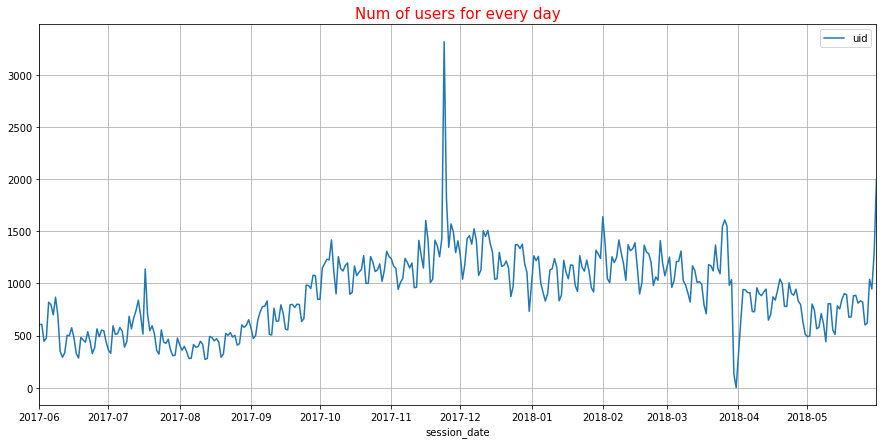

 The mean number of daily active users: 908


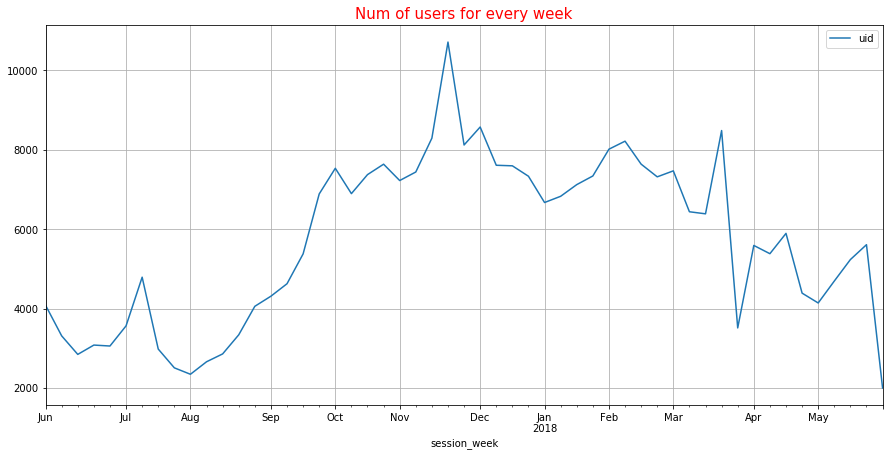

The mean number of weekly active users: 5724


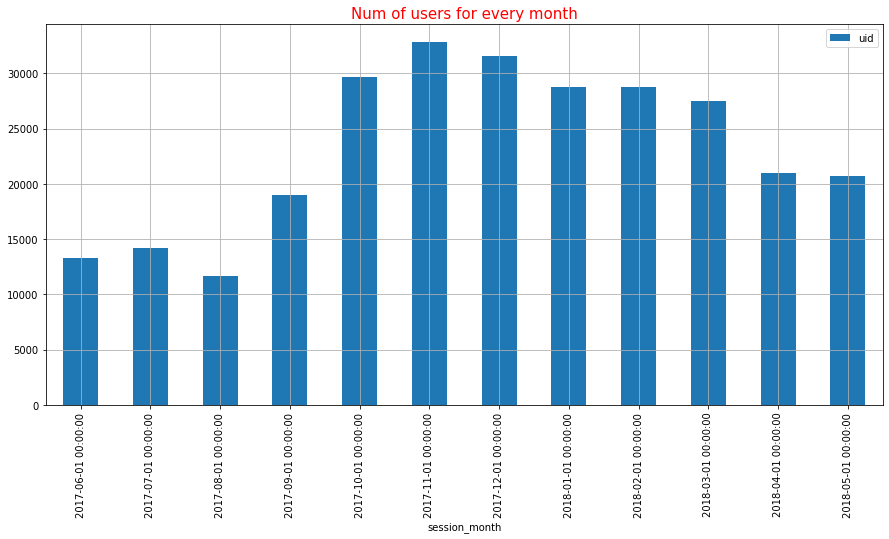

The mean number of monthly active users: 23228


In [5]:
import matplotlib.pyplot as plt
visits['session_month'] = visits['start_ts'].astype('datetime64[M]')
visits['session_week']  = visits['start_ts'].astype('datetime64[W]')
visits['session_date'] = visits['start_ts'].dt.date
dau_mean = visits.groupby('session_date').agg({'uid': 'nunique'}).mean()
wau_mean = visits.groupby('session_week').agg({'uid': 'nunique'}).mean()
mau_mean = visits.groupby('session_month').agg({'uid': 'nunique'}).mean()
daily_users = visits.groupby('session_date').agg({'uid': 'nunique'}).reset_index()
weekly_users = visits.groupby('session_week').agg({'uid': 'nunique'}).reset_index()
monthly_users = visits.groupby('session_month').agg({'uid': 'nunique'}).reset_index()
daily_users.plot('session_date', 'uid', figsize=(15, 7))
plt.title('Num of users for every day', color = 'red', size = 15)
plt.grid()
plt.show()
print(' The mean number of daily active users:', int(dau_mean.round()))
weekly_users.plot('session_week', 'uid', figsize=(15, 7))
plt.title('Num of users for every week', color = 'red', size = 15)
plt.grid()
plt.show()
print('The mean number of weekly active users:', int(wau_mean.round()))
monthly_users.plot('session_month', 'uid', figsize=(15, 7), kind = 'bar')
plt.title('Num of users for every month', color = 'red', size = 15)
plt.grid()
plt.show()
print('The mean number of monthly active users:', int(mau_mean.round()))

There is certain peaks of users on specific dates, understanding what caused this peaks will improve users inflow in the future.

It may be some special offer or good promotion.

How many sessions are there per day? 

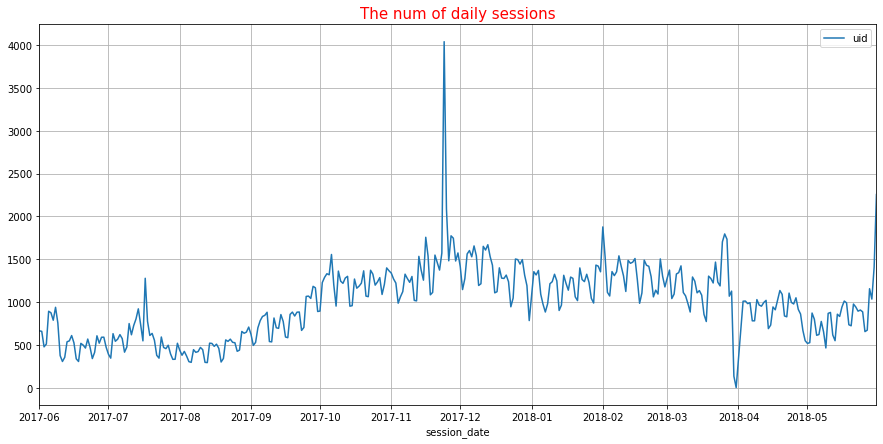

The mean number of daily sessions: 987


In [6]:
daily_sessions = visits.groupby('session_date').agg({'uid': 'count'}).reset_index()
daily_sessions.plot('session_date', 'uid', figsize=(15, 7))
plt.title('The num of daily sessions', color = 'red', size = 15)
plt.grid()
plt.show()
avg = visits.groupby('session_date').agg({'uid': 'count'}).mean()
print('The mean number of daily sessions:', int(avg.round()))

There is clear correlation between number of users and number of sessions

What is the length of each session?

In [7]:
import plotly.express as px
visits['session_duration'] = (visits['end_ts'] - visits['start_ts']).dt.seconds
visits = visits[visits['session_duration'] > 0] # I got rid of all rows with session duration that is 0
print(visits['device'].value_counts())
touch = visits[visits['device'] == 'touch']
desktop = visits[visits['device'] == 'desktop']
touch_med = touch['session_duration'].median()
desktop_med = desktop['session_duration'].median()
print('The most common time session of touch device users is:',int(touch_med),'seconds')
print('The most common time session of desktop device users is:',int(desktop_med),'seconds')
fig = px.histogram(visits[visits['session_duration']<1800], x='session_duration', nbins=30)
fig.update_layout(title_font_color='red', title_font_size=15,
    title={    
        'text': 'Sessions seconds duration',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          })
fig.show()

desktop    238878
touch       84728
Name: device, dtype: int64
The most common time session of touch device users is: 240 seconds
The most common time session of desktop device users is: 420 seconds


First of all we need to pay attention to the fact that the desktop device is almost three time used more then the touch device and the time of desktop session almost twice longer, when people use more and more mobile devices that fact seems to be strange and the touch version of the app needs to be checked for issues. To analyze sessions durations I used the duration that took more then zero seconds and less then 30 minutes which is reasonable time in consideration of the fact that most of the sessions took 100 - 190 seconds.

In [8]:
# Calculating sticky facktors:
sticky_wau = int(dau_mean/wau_mean*100)
sticky_mau = int(dau_mean/mau_mean*100)
print('The sticky facktors (users loyalty) on weekly basis is {}%'.format(sticky_wau),'and on monthly basis is {}%'.format(sticky_mau))

The sticky facktors (users loyalty) on weekly basis is 15% and on monthly basis is 3%


In Order to analyze the sticky factors and get the conclusions we need to compare it with industry benchmarks. I used the median function in order to find out what is the most common session time for users from each device cause the mean time would be much affected by the outliers. In this case I suggest we need to take all session into further consideration except the zero time duration sessions, cause if there is some users who just connected for few seconds to check some particular detail or users who took their time to make decisions they are all potential buyers.

How often do users come back?

In [9]:
import numpy as np
user_activity = visits[['uid', 'session_date']]
first_activity_date = visits.groupby(['uid'])['session_date'].min()
first_activity_date.name = 'first_activity_date'
user_activity = user_activity.join(first_activity_date, on='uid')
user_activity['first_activity_month'] = user_activity['first_activity_date'].astype('datetime64[M]')
user_activity['activity_month'] = user_activity['session_date'].astype('datetime64[M]')
user_activity['cohort_lifetime'] = user_activity['activity_month'] - user_activity['first_activity_month']
user_activity['cohort_lifetime'] = (user_activity['cohort_lifetime'] / np.timedelta64(1,'M')).round()
user_activity['cohort_lifetime'] = user_activity['cohort_lifetime'].astype(int)
cohorts = user_activity.groupby(['first_activity_month','cohort_lifetime']).agg({'uid':'nunique'}).reset_index()
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][['first_activity_month','uid']]
initial_users_count = initial_users_count.rename(columns={'uid':'cohort_users'})
cohorts = cohorts.merge(initial_users_count,on='first_activity_month')
cohorts['retention'] = cohorts['uid']/cohorts['cohort_users']

In [10]:
cohorts_activity = cohorts.loc[cohorts['cohort_lifetime']==0,['cohort_users', 'first_activity_month']]
cohorts_activity = cohorts_activity.rename(columns={'uid':'users_mean'})
cohorts_mean = cohorts.groupby('first_activity_month')['uid'].mean().reset_index()
cohorts_mean = cohorts_mean.rename(columns={'uid':'users_mean'})
cohorts_mean = cohorts_mean.merge(cohorts_activity, on='first_activity_month')

The code was fixed

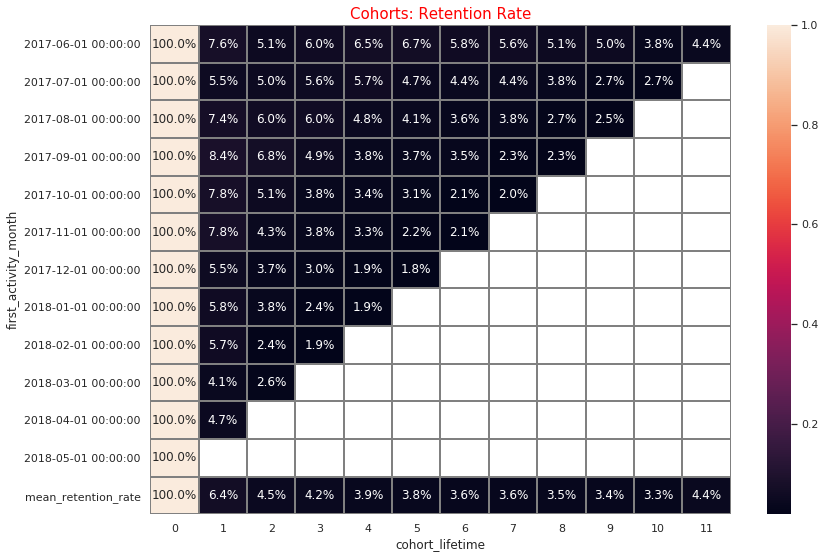

In [11]:
import seaborn as sns
churn_pivot = cohorts.pivot_table(index='first_activity_month',columns='cohort_lifetime',values='retention',aggfunc='sum')
#churn_pivot['mean_retention_rate'] = churn_pivot.cumsum(axis=0)
churn = churn_pivot.mean(axis=0)
churn.name='mean_retention_rate'
churn_pivot = churn_pivot.append(churn)
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: Retention Rate', color = 'red', size = 15)
sns.heatmap(churn_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray')
plt.show()

Ok. I fixed the mean calculation

As we can see from the heatmap retention rate is consistently declining, in order to understand the reason we should pay closer attention to the cohort of March 2018 that extremely low, finding the reason "why" may give as a clue about the general decline as well. 

There is peaks of new users interests at the beginning of each cohort, but with the time is passed users losing their interest and its important to understand why.

### Sales

When do people start buying?


In [12]:
min_visit = visits.groupby(['uid'])['start_ts'].min().reset_index()
min_order = orders.groupby(['uid'])['buy_ts'].min().reset_index()
actual_first_visit = min_visit.merge(min_order, on =['uid'], how = 'left')
actual_first_visit[actual_first_visit['buy_ts'] < actual_first_visit['start_ts']]
min_order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36523 entries, 0 to 36522
Data columns (total 2 columns):
uid       36523 non-null uint64
buy_ts    36523 non-null datetime64[ns]
dtypes: datetime64[ns](1), uint64(1)
memory usage: 570.8 KB


In [13]:
actual_first_visit['first_visit']=actual_first_visit.apply(lambda row: row.start_ts if row.start_ts<row.buy_ts\
                                                          or isinstance(row.buy_ts,pd._libs.tslibs.nattype.NaTType)\
                                                          else row.buy_ts,axis=1)

In [14]:
conversion_data=actual_first_visit[['uid','first_visit']].merge(min_order, on=['uid'])
conversion_data['conversion_date']=((conversion_data['buy_ts']-conversion_data['first_visit'])/np.timedelta64(1,'D')).astype(int)
conversion_data.head()

,uid,first_visit,buy_ts,conversion_date
0,313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00,106
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0
2,2429014661409475,2017-10-11 17:14:00,2017-10-11 18:33:00,0
3,2464366381792757,2018-01-27 20:10:00,2018-01-28 15:54:00,0
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0


In [15]:
conversion_data['Conversion_0d']=conversion_data['conversion_date'].apply(lambda x: x==0)
conversion_data['Conversion_7d']=conversion_data['conversion_date'].apply(lambda x: x<=7)
conversion_data['Conversion_14d']=conversion_data['conversion_date'].apply(lambda x: x<=14)
conversion_data['Conversion_30d']=conversion_data['conversion_date'].apply(lambda x: x<=30)
conversion_table=[]
for i in ['Conversion_0d','Conversion_7d','Conversion_14d','Conversion_30d']:
    conversion_table.append((i,conversion_data[conversion_data[i]==True]\
                             .groupby([i])['uid'].nunique().reset_index()['uid'].loc[0]/visits.uid.nunique()*100)) 

In [16]:
source_per_user = visits.groupby('uid')['source_id'].min().reset_index()
converted_users_per_source = source_per_user.merge(conversion_data[['conversion_date','uid']], on=['uid'], how='inner')
converted_users_per_source = converted_users_per_source.groupby('source_id')['uid'].count().reset_index()
converted_users_per_source = converted_users_per_source.rename(columns={'uid':'users'})
fig=px.bar(converted_users_per_source,x='source_id',y='users', text='users')
fig.update_layout(xaxis = dict(tick0 = 1, dtick = 1),title_font_color='red', title_font_size=15, 
    title={    
        'text': 'Number of users per source',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          })
fig.update_traces(texttemplate='%{text:.2s}', textposition='inside')
fig.show()

In [17]:
source_per_user[(source_per_user['source_id'] > 5) & (source_per_user['source_id'] < 9)].count()

uid          29
source_id    29
dtype: int64

After slicing the number of users by source, the most profitable sources are: 3-4, we need to look at how to develop them more and what make them so profitable? Also we need to check what happening with sources 6-8 may be the best solution is to get rid of them, and how to increase sources 9-10?

In [18]:
from pandas import DataFrame
conversion_table=DataFrame(conversion_table,columns=['Conversion','Rate'])
conversion_table.head()

,Conversion,Rate
0,Conversion_0d,12.862048
1,Conversion_7d,14.269914
2,Conversion_14d,14.689618
3,Conversion_30d,15.247934


In [19]:
fig=px.line(conversion_table,x='Conversion',y='Rate')
fig.update_layout(title_font_color='red', title_font_size=15,
    title={    
        'text': 'Roling Conversion%',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          })

fig.show()

Examining conversion rate I concluded that most of the users become customers on the first day of registry, wich is almost 13%, then the rate increases only approximately by 2% till the 30-th day after registration. I suggest to consider marketing promotion to attract back already registered users, its may be either for them to make deposit after they already registered. The conversion rate should be compared with industry benchmark.  

How many orders do they make during a given period of time?

In [20]:
conversion_data['buy_ts'] = conversion_data['buy_ts'].dt.date
orders_per_user = conversion_data.groupby('buy_ts')['uid'].count().reset_index()
#orders_per_user

In [21]:
orders_per_user = orders_per_user.rename(columns={'uid':'num_of_orders','buy_ts': 'dates'})
display(orders_per_user.sort_values(by='num_of_orders',ascending = False).head())
fig=px.bar(orders_per_user,x='dates',y='num_of_orders')
fig.update_layout(title_font_color='red', title_font_size=15,
    title={    
        'text': 'Number of Orders',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          })

fig.show()

,dates,num_of_orders
176,2017-11-24,591
362,2018-05-31,483
127,2017-10-06,296
245,2018-02-01,253
177,2017-11-25,224


There is high spikes on the users orders graph, specialy on 24.11.2017 and 31.05.2018 dates. 
We need to learn what cause those spikes, what made users to make much more orders on those dates and used it in the future.

What is the average purchase size?

In [22]:
avg_purchase_size = orders.groupby('uid')['revenue'].mean().reset_index()
top_ten_users = avg_purchase_size.sort_values(by='revenue',ascending = False).head(10)
top_ten_users


,uid,revenue
22073,11149926373378902217,657.466250
31999,16152080406371512880,550.000000
23877,12069004609949546307,407.000000
18462,9352364483376991844,201.670000
1667,838624912253662121,195.550000
31729,16022927424075233241,176.000000
504,255246909617571582,168.056667
34255,17296569523374666680,158.125000
5005,2533570982362194729,152.780000
35151,17736660553583784503,137.497500


I calculated the average purchase size of top ten users, we need get to know better best customers in order to know how to attract them more.

In [23]:
orders['order_month'] = orders['buy_ts'].astype('datetime64[M]')
first_orders = orders.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
cohort_sizes = first_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_order_month', 'n_buyers']
orders_ = pd.merge(orders,first_orders, on='uid')
cohorts = orders_.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()
report = pd.merge(cohort_sizes, cohorts, on='first_order_month')

In [24]:
margin_rate = 1
report['age'] = (report['order_month'] - report['first_order_month']) / np.timedelta64(1, 'M')
report['age'] = report['age'].round().astype('int')
report['ltv'] = (report['revenue'] * margin_rate)/ report['n_buyers']

output = report.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='ltv', 
    aggfunc='mean')

output.fillna('') 
first_cohort = output.loc['2017-06-01'].sum()
print(first_cohort.round(2))

11.88


In [25]:
output = output.cumsum(axis=1)
mean_ltv = output.mean(axis=0)
mean_ltv.name = 'mean_ltv_per_cohort'
output = output.append(mean_ltv)
#mean_ltv

In order to avoid cumulative error I removed rounding LTV

On average, each customer from the first month cohort 31.05.2017 brought 11.88$ in revenue over their 12-month liftetime till 01.06.2018

How much money do they bring? LTV

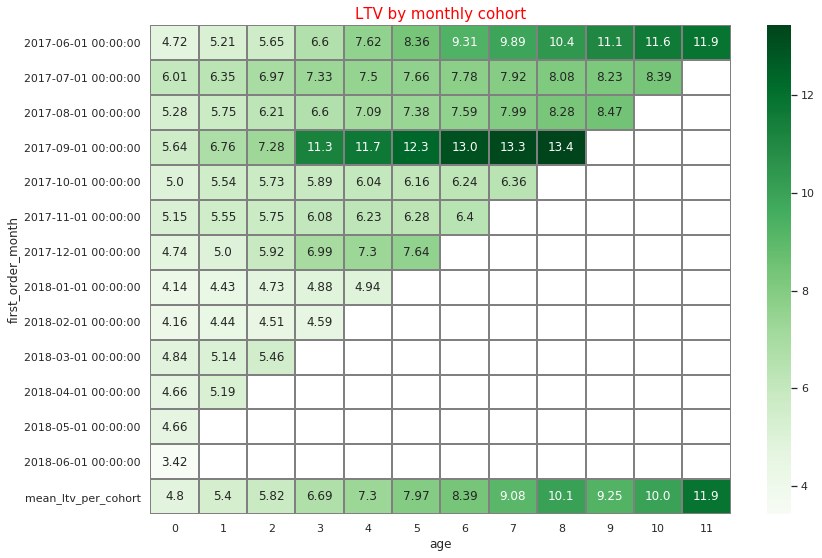

In [26]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('LTV by monthly cohort', color = 'red', size = 15)
sns.heatmap(output, annot=True, fmt='.3', linewidths=1, linecolor='gray', cmap='Greens')
plt.show()

LTV is a cumulative metric and in order to see how much on average each customer brought in revenue for each cohort we need to sum each row per cohort.

Ok. I fixed the mean calculation

Now we can see how much on average each customer bought by monthly cohort during the whole life time, as long as the cohort getting older the average is dropping thats means that users are losing interest with time, we need to find out the way how to "heat them up".

In order to understand what causing users losing interest I suggest to ran a survey for extra bonuses and invest more in already existing users.

In order to understand if the sales are good we need to compare our results with our competitors and against the sector of industry. To understand if company is profitable we need to calculate the expenses in the next step.

 ### Marketing

How much money was spent? 

In [27]:
import plotly.graph_objects as go
costs['month'] = costs['dt'].astype('datetime64[M]')
orders['month'] = orders['order_month'].astype('datetime64[M]')
monthly_costs = costs.groupby('month')['costs'].sum().reset_index()
monthly_revenue = orders.groupby('month')['revenue'].sum().reset_index()
fig = go.Figure()
fig.add_trace(go.Bar(x=monthly_revenue['month'],y=monthly_revenue['revenue'],text=monthly_revenue['revenue'],name='revenue'))
fig.add_trace(go.Bar(x=monthly_costs['month'],y=monthly_costs['costs'],text=monthly_revenue['revenue'],name='(costs)')),
fig.update_layout(title_font_color='red', title_font_size=15, barmode='group', xaxis_tickangle=-45, xaxis = dict(dtick="M1"),                          
    title={    
        'text': 'Revenue\Costs',
        'y':0.85,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          }) 
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

To get the general picture I calculated all the expenses per month and compared it to the revenue per month, as we can clearly see it from the bar graph the  expenses are higher than income. To figure out what can be done we need to analyse the costs for each sours.

How much money was spent in each sours?

In [28]:
cost_per_source = costs.groupby('source_id')['costs'].sum().reset_index()
fig=px.bar(cost_per_source,x='source_id',y='costs', text='costs')
fig.update_layout(xaxis = dict(tick0 = 1, dtick = 1),title_font_color='red', title_font_size=15,              
    title={    
        'text': 'Total expenses by source',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          })
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

In [29]:
costs[(costs['source_id'] > 5) & (costs['source_id'] < 8)]

,source_id,dt,costs,month


Now we can define that sourse number 3 is the most expensive (almost twice expensive than source number 4 that comes right after it), but as we found out this before on users per sours graph its also brings us more users then others sourses, let's check how much each source costs per user?

How much did customer acquisition from each of the sources cost?

In [30]:
users_per_source = visits.groupby('source_id')['uid'].nunique().reset_index()
users_per_source = users_per_source.rename(columns={'uid':'users'})
sources_cost = pd.merge(cost_per_source, users_per_source, on='source_id')
sources_cost['cost_asquisition'] = sources_cost['costs']/sources_cost['users']
fig=px.bar(sources_cost, x='source_id', y='cost_asquisition', text='cost_asquisition')
fig.update_layout(xaxis = dict(tick0 = 1, dtick = 1),title_font_color='red', title_font_size=15,              
    title={    
        'text': 'CAC (customer acquisition cost) ',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          })
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

As we can see users who came from the source N 3 are also most expencive, now whats left to check is ROI per source in order to identify which sources are profitable?

In [31]:
source = orders.merge(visits[['source_id','uid','device']].drop_duplicates(subset=['uid']), on='uid', how='left')
roi_per_source = source.groupby('source_id')['revenue'].sum().reset_index()
costs_per_source = costs.groupby('source_id')['costs'].sum().reset_index() 
roi_per_source = pd.merge(roi_per_source, costs_per_source, on='source_id')
roi_per_source['roi'] = roi_per_source['revenue']/roi_per_source['costs']
roi_per_source.head()

,source_id,revenue,costs,roi
0,1.0,39160.46,20833.27,1.879708
1,2.0,65326.22,42806.04,1.526098
2,3.0,43845.34,141321.63,0.310252
3,4.0,51073.39,61073.60,0.836260
4,5.0,39885.94,51757.10,0.770637


How worthwhile where the investments? ROI

In [32]:
first_users_order = orders.groupby(['uid','order_month']).agg({'revenue':'sum'}).reset_index()
first_users_order = first_users_order.rename(columns={'order_month':'activity_month'})
user_cohort = user_activity[['uid','cohort_lifetime','activity_month']]
first_users_order = first_users_order.merge(user_cohort, on=['uid', 'activity_month'], how='left')

costs_per_month=costs.groupby('month')['costs'].sum().reset_index()
costs_per_month=costs_per_month.rename(columns={'month':'first_order_month'})

tot_report=report.merge(costs_per_month, on='first_order_month')
tot_report['cac']=tot_report['costs']/tot_report['n_buyers']
tot_report['roi']=tot_report['ltv']/tot_report['cac']

roi_output = tot_report.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='roi', 
    aggfunc='mean')
roi_output.fillna('')
roi_output = roi_output.cumsum(axis=1)
mean_roi = roi_output.mean(axis=0)
mean_roi.name = 'mean_roi_per_cohort'
roi_output = roi_output.append(mean_roi)

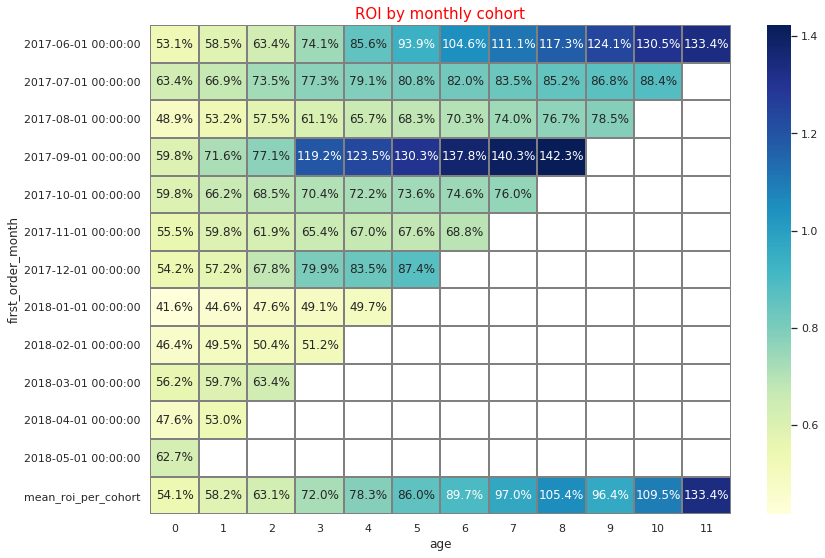

In [33]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('ROI by monthly cohort', color = 'red', size = 15)
sns.heatmap(roi_output, annot=True, fmt='.1%', linewidths=1, linecolor='gray', cmap='YlGnBu')
plt.show()

The mean values were added

In [34]:
fig=px.bar(roi_per_source, x='source_id', y='roi', text='roi')
fig.update_layout(xaxis = dict(tick0 = 1, dtick = 1),title_font_color='red', title_font_size=15,              
    title={    
        'text': 'Return on investment per source (roi)',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          })
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

We learn that source 1 and then 2 are most profitable (the roi above 1 value), and the investments in those sources bring most valuable users, Although source N 3 brings much more users from other sources it's the most expensive and not profitable source with lowest roi mach below 1. Sources 6 - 8 including seems to be abandoned that could be for a reason, sources 4 and 5 are also not profitable and can be considered for closing, source 9 has much of potential and has to be more developed, for a little users that it brings compared to other active sources it's a profitable source (roi above 1).  

Revenue for various devices per source:

In [35]:
desktop_device = source[source['device']=='desktop']
touch_device = source[source['device']=='touch']
rev_by_source_desk_dev = desktop_device.groupby('source_id')['revenue'].sum().reset_index()
rev_by_source_touch_dev = touch_device.groupby('source_id')['revenue'].sum().reset_index()
fig = go.Figure()
fig.add_trace(go.Bar(x=rev_by_source_desk_dev['source_id'],y=rev_by_source_desk_dev['revenue'],text=rev_by_source_desk_dev['revenue'],name='desktop'))
fig.add_trace(go.Bar(x=rev_by_source_touch_dev['source_id'],y=rev_by_source_touch_dev['revenue'],text=rev_by_source_touch_dev['revenue'],name='touch')),
fig.update_layout(title_font_color='red', title_font_size=15, barmode='group', xaxis = dict(dtick=1),                        
    title={    
        'text': 'Revenue per source by different devices',
        'y':0.85,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
          }) 
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.show()

As it was expected the desktop device brings much more of profit, cause it has almost 3 times more users and that issue needs to be checked.

After examining ROI by cohorts, ROI like LTV is cumulative metric so in the bottomline of heatmap I colculated the total ROI per cohort, as we can see there is only two cohorts wich are profitable out of 12 for now, this situation can be improved since the first cohort's ROI which is the older one was calculated for 12 month and it's profitable (roi above 1) also the fourth cohort wich starts on 01.09.2017 and calculated only for 9 month is even better, that means there is a potential for other cohorts as well. For general conclusion we need to start with cutting not profitable sources. 

### Conclusion

First of all I suggest to start with checking how the app for touch devices working, to understand why there is so much less users that use this app when the trend of touch devices is growing. Then we need to focus on company sources and consider to get rid of not profitable like source 3 for example, and check how to expand profitable, especially potential of source 9. In addition as we saw with time the interest of users dropping and we need find a way to attract them back, may be to run some promotion for older users. 

Most of the conversion (13%) of users happens at the first day and then it improves only for 2%-3%, more close attention and research needed to figure out how the conversion works? May be users who just registered were simply neglected?
Also as a resolt of dropping existing customers interest may be we should consider to invest more into users who already made orders in the past, like offer them better deals or some extra bonuses and less investing in sources, start with cutting useless expenses.
To get the full picture we need to compare results with our competitors and against the industry sector in general.